Cytoplasm segmentation using Kmeans Clustering and HSV colorspace

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import os

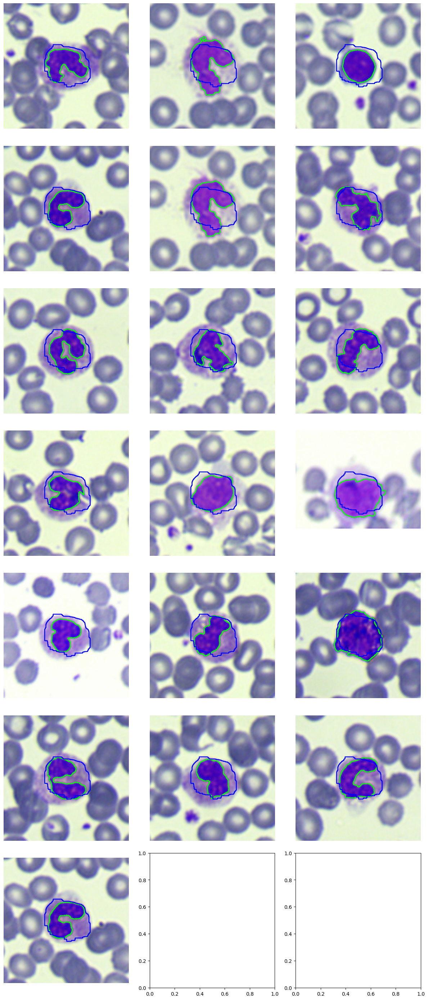

In [10]:
# Final Function for nucleus parameters and cytoplasm
# Directory containing the images
input_dir = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\Selected_images"
imagename = []
# List to store the processed images
processed_images = []
Nucleus_Areas = []
Nucleus_Perimeters = []
Area_hull = []
Perimeter_hull = []
# Iterate over the images in the directory
for filename in os.listdir(input_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        input_path = os.path.join(input_dir, filename)
        image = cv2.imread(input_path)

        # Perform the processing steps
        # image = cv2.imread(input_path)
        image_copy = image.copy()

        # plt.imshow(blurM)

        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        img_hsv = cv2.cvtColor(lab, cv2.COLOR_BGR2HSV)

        # Define the lower and upper bounds for the green color in the HSV color space
        lower_green = np.array([40, 130, 170])
        upper_green = np.array([90, 255, 255])

       # Threshold the HSV image based on the color range
        img_mask = cv2.inRange(img_hsv, lower_green, upper_green)
        # plt.imshow(img_mask)
        # Find contours in the thresholded image
        contours, _ = cv2.findContours(
            img_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        pixels = image.reshape(-1, 3)
        pixels = np.float32(pixels)
        # Define the criteria for K-means clustering (maximum iterations and epsilon)
        criteria = (cv2.TERM_CRITERIA_EPS +
                    cv2.TERM_CRITERIA_MAX_ITER, 100, 0.5)

        # Perform K-means clustering
        k = 7  # Number of clusters
        _, labels, centers = cv2.kmeans(
            pixels, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)

        # Convert the centers to unsigned integers
        centers = np.uint8(centers)
        # Map the labels to the centers
        segmented_image = centers[labels.flatten()]

        # Reshape the segmented image back to the original shape
        segmented_image = segmented_image.reshape(image.shape)

        # Convert the segmented image to grayscale
        segmented_image_gray = cv2.cvtColor(
            segmented_image, cv2.COLOR_RGB2GRAY)

        # Threshold the grayscale image
        _, segmented_mask = cv2.threshold(
            segmented_image_gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

        # Apply the segmented mask to the original image
        segmented_result = cv2.bitwise_and(
            image_copy, image_copy, mask=segmented_mask)

        mask = np.zeros(segmented_mask.shape[:2], dtype="uint8")
        segmented_copy = segmented_result.copy()
        # contours, _ = cv2.findContours(contour_portion,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        segmented_gray = cv2.cvtColor(segmented_result, cv2.COLOR_BGR2HSV)
        L, A, B = cv2.split(segmented_gray)
        kernel = np.ones((20, 10), np.uint8)
        _, thresholded_image = cv2.threshold(L, 128, 255, cv2.THRESH_BINARY)
        # Perform morphological closing to fill holes
        filled_image = cv2.morphologyEx(
            thresholded_image, cv2.MORPH_CLOSE, kernel)
        kernel = np.ones((15, 15), np.uint8)
        # Perform morphological opening to remove small dust particles
        opened_image = cv2.morphologyEx(filled_image, cv2.MORPH_OPEN, kernel)
        contours_cyto, _ = cv2.findContours(
            opened_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # Select the center contour

        contour_areas = [cv2.contourArea(contour) for contour in contours_cyto]
        contour_perimeter = [cv2.arcLength(
            contour, True) for contour in contours_cyto]
        # Find the index of the contour with the largest area
        max_area_index = np.argmax(contour_areas)
        max_peri_index = np.argmax(contour_perimeter)
        area = contour_areas[max_area_index]
        peri = contour_perimeter[max_peri_index]
        Cyto_area.append(area)
        Cyto_Perimeter.append(peri)
        # processed_image.append(image_copy)
        # cv2.drawContours(image_copy, contours_cyto, -1, (0,0,255),2)
        # Select the center contour
    contours_cyto_center = select_center_contour(contours_cyto)
    center_contour = select_center_contour(contours)
    convex_hull = cv2.convexHull(center_contour)
    Area_hull.append(cv2.contourArea(convex_hull))
    Perimeter_hull.append(cv2.arcLength(convex_hull, True))

    # Check if a center contour was found
    if center_contour is not None:
        # Draw the center contour on the image
        cv2.drawContours(image_copy, [center_contour], -1, (0, 255, 0), 2)
        # cv2.drawContours(image_copy, [convex_hull], -1, (0, 0, 255), 2)

    # ... additional processing or analysis using the center contour
    else:
        print("No center contour found.")

    '''Areas.append(area)
    Perimeters.append(perimeter)'''
    processed_images.append(image_copy)

    cv2.drawContours(image_copy, [contours_cyto_center], -1, (255, 0, 0), 2)
# Create a grid for displaying the images
grid_rows = int(np.ceil(len(processed_images) / 3))
fig, axes = plt.subplots(grid_rows, 3, figsize=(12, 4 * grid_rows))

# Iterate over the processed images and display them in the grid
for i, image in enumerate(processed_images):
    row = i // 3
    col = i % 3
    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

# Adjust the layout and display the grid
plt.tight_layout()
plt.show()

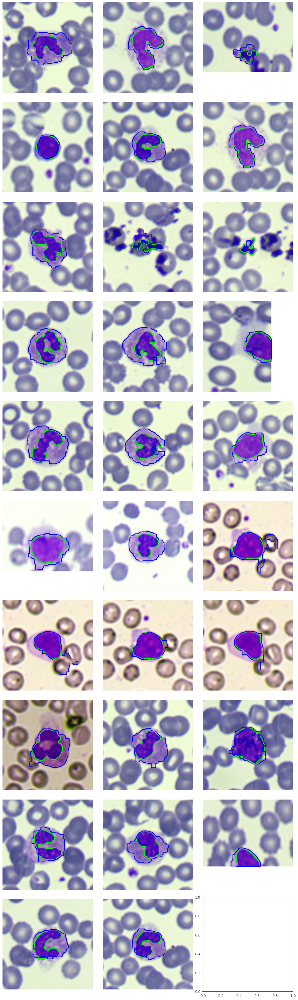

In [9]:
# Final Function for nucleus parameters and cytoplasm
# Directory containing the images
input_dir = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8"
imagename = []
# List to store the processed images
processed_images = []
Nucleus_Areas = []
Nucleus_Perimeters = []
Area_hull = []
Perimeter_hull = []
Cyto_Area = []
Cyto_Peri = []
# Iterate over the images in the directory
for filename in os.listdir(input_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        input_path = os.path.join(input_dir, filename)
        image = cv2.imread(input_path)

        # Perform the processing steps
        # image = cv2.imread(input_path)
        image_copy = image.copy()

        # plt.imshow(blurM)

        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        img_hsv = cv2.cvtColor(lab, cv2.COLOR_BGR2HSV)

        # Define the lower and upper bounds for the green color in the HSV color space
        lower_green = np.array([40, 130, 170])
        upper_green = np.array([90, 255, 255])

       # Threshold the HSV image based on the color range
        img_mask = cv2.inRange(img_hsv, lower_green, upper_green)
        # plt.imshow(img_mask)
        # Find contours in the thresholded image
        contours, _ = cv2.findContours(
            img_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        pixels = image.reshape(-1, 3)
        pixels = np.float32(pixels)
        # Define the criteria for K-means clustering (maximum iterations and epsilon)
        criteria = (cv2.TERM_CRITERIA_EPS +
                    cv2.TERM_CRITERIA_MAX_ITER, 100, 0.5)

        # Perform K-means clustering
        k = 7  # Number of clusters
        _, labels, centers = cv2.kmeans(
            pixels, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)

        # Convert the centers to unsigned integers
        centers = np.uint8(centers)
        # Map the labels to the centers
        segmented_image = centers[labels.flatten()]

        # Reshape the segmented image back to the original shape
        segmented_image = segmented_image.reshape(image.shape)

        # Convert the segmented image to grayscale
        segmented_image_gray = cv2.cvtColor(
            segmented_image, cv2.COLOR_RGB2GRAY)

        # Threshold the grayscale image
        _, segmented_mask = cv2.threshold(
            segmented_image_gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

        # Apply the segmented mask to the original image
        segmented_result = cv2.bitwise_and(
            image_copy, image_copy, mask=segmented_mask)

        mask = np.zeros(segmented_mask.shape[:2], dtype="uint8")
        segmented_copy = segmented_result.copy()
        # contours, _ = cv2.findContours(contour_portion,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        segmented_gray = cv2.cvtColor(segmented_result, cv2.COLOR_BGR2HSV)
        h, S, V = cv2.split(segmented_gray)
        kernel = np.ones((20, 10), np.uint8)
        _, thresholded_image = cv2.threshold(L, 128, 255, cv2.THRESH_BINARY)
        # Perform morphological closing to fill holes
        filled_image = cv2.morphologyEx(
            thresholded_image, cv2.MORPH_CLOSE, kernel)
        kernel = np.ones((15, 15), np.uint8)
        # Perform morphological opening to remove small dust particles
        opened_image = cv2.morphologyEx(filled_image, cv2.MORPH_OPEN, kernel)
        contours_cyto, _ = cv2.findContours(
            opened_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # Select the center contour

        def select_center_contour(contours):
            if len(contours) == 0:
                return None

            # Compute the areas of all contours
            contour_areas = [cv2.contourArea(contour) for contour in contours]

            # Find the index of the contour with the largest area
            max_area_index = np.argmax(contour_areas)

            # Return the contour with the largest area
            center_contour = contours[max_area_index]

            return center_contour

        # processed_image.append(image_copy)
        # cv2.drawContours(image_copy, contours_cyto, -1, (0,0,255),2)
        # Select the center contour
    contours_cyto_center = select_center_contour(contours_cyto)
    center_contour = select_center_contour(contours)
    convex_hull = cv2.convexHull(center_contour)
    Area_hull.append(cv2.contourArea(convex_hull))
    Perimeter_hull.append(cv2.arcLength(convex_hull, True))
    Cyto_Area.append(cv2.contourArea(contours_cyto_center))
    Cyto_Peri.append(cv2.arcLength(contours_cyto_center, True))
    # Check if a center contour was found
    if center_contour is not None:
        # Draw the center contour on the image
        cv2.drawContours(image_copy, [center_contour], -1, (0, 255, 0), 2)
        # cv2.drawContours(image_copy, [convex_hull], -1, (0, 0, 255), 2)

    # ... additional processing or analysis using the center contour
    else:
        print("No center contour found.")

    processed_images.append(image_copy)

    cv2.drawContours(image_copy, [contours_cyto_center], -1, (255, 0, 0), 2)
# Create a grid for displaying the images
grid_rows = int(np.ceil(len(processed_images) / 3))
fig, axes = plt.subplots(grid_rows, 3, figsize=(12, 4 * grid_rows))

# Iterate over the processed images and display them in the grid
for i, image in enumerate(processed_images):
    row = i // 3
    col = i % 3
    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

# Adjust the layout and display the grid
plt.tight_layout()
plt.show()

In [7]:
import pandas as pd
final_df = pd.read_csv(
    "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\final.csv", index_col=0)
final_df["Cyto_Area"] = Cyto_Area
final_df["Cyto_Perimeter"] = Cyto_Peri

final_df = final_df.rename(
    columns={"CYTO_AREA": "CONVEX_AREA", "CYTO_PERIMETER": "CONVEX_PERIMETER"})
final_df.sort_values('Cyto_Perimeter')

,IMAGE_NAME,NUCLEUS_AREA,NUCLEUS_PERIMETER,CONVEX_AREA,CONVEX_PERIMETER,Solidity,Convexity,Circularity,Nucleus_area_upon_perimeter,Predicted Class,Confidence Score,Cyto_Area,Cyto_Perimeter
8,final_image17.jpg,2233.5,302.977702,3320.0,225.600430,0.672741,0.744611,3.270586,7.371830,NaN,NaN,905.5,143.556349
7,final_image16.jpg,3677.0,546.558436,6452.5,335.481014,0.569857,0.613806,6.465018,6.727551,neutrophil,0.698985,3580.5,309.012193
3,final_image12.jpg,8940.0,359.019332,9059.5,339.023539,0.986809,0.944304,1.147330,24.901166,lymphocyte,0.863467,8383.0,358.936071
2,final_image11.jpg,2766.0,343.019332,3909.0,230.160194,0.707598,0.670983,3.385128,8.063685,NaN,NaN,5418.0,360.367531
26,final_image7.jpg,6358.0,330.793936,6464.5,318.585965,0.983525,0.963095,1.369571,19.220425,NaN,NaN,8595.5,395.722870
11,final_image2.jpg,11788.5,429.261973,11949.0,407.264517,0.986568,0.948755,1.243874,27.462251,lymphocyte,0.572558,13893.5,496.208150
4,final_image13.jpg,8698.0,513.102592,10386.0,376.777377,0.837474,0.734312,2.408680,16.951776,neutrophil,0.637150,16125.0,520.735062
28,final_image9.jpg,8588.0,513.931021,10358.5,376.715457,0.829078,0.733008,2.447416,16.710414,neutrophil,0.683363,16281.5,527.178713
16,final_image24.jpg,7322.5,385.948265,8077.0,330.470260,0.906587,0.856255,1.618784,18.972750,basophil,0.651130,17337.0,538.391916
27,final_image8.jpg,10266.5,585.972650,13709.0,431.221293,0.748888,0.735907,2.661475,17.520442,neutrophil,0.625972,17626.0,554.735062


In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\image_sample"

processed_image = []
Cyto_area = []
Cyto_Perimeter = []
# Iterate over the images in the folder
for filename in os.listdir(input_path):
    if filename.endswith(".jpg"):
        image_path = os.path.join(input_path, filename)

       # Read the image
        image = cv2.imread(image_path)
        image_copy = image.copy()

        # plt.imshow(blurM)

        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        img_hsv = cv2.cvtColor(lab, cv2.COLOR_BGR2HSV)

        # Define the lower and upper bounds for the green color in the HSV color space
        lower_green = np.array([40, 130, 170])
        upper_green = np.array([90, 255, 255])

        # Threshold the HSV image based on the color range
        img_mask = cv2.inRange(img_hsv, lower_green, upper_green)
        # plt.imshow(img_mask)
        # Find contours in the thresholded image
        contours, _ = cv2.findContours(
            img_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        def select_center_contour(contours):
            if len(contours) == 0:
                return None

            # Compute the areas of all contours
            contour_areas = [cv2.contourArea(contour) for contour in contours]

            # Find the index of the contour with the largest area
            max_area_index = np.argmax(contour_areas)

            # Return the contour with the largest area
            center_contour = contours[max_area_index]

            return center_contour
        nucleus_contour = select_center_contour(contours)
        cv2.drawContours(image_copy, nucleus_contour, -1, (0, 255, 0), 2)
        # cv2.drawContours(image_copy, nucleus_contours, -1, (0, 255, 0), 2)
        # Create a binary mask image and draw nuclei contours
        mask = np.zeros(image.shape[:2], dtype=np.uint8)
        cv2.drawContours(mask, nucleus_contour, -1, 255, thickness=cv2.FILLED)
        # Dilate the nuclei contours
        dilated_mask = cv2.dilate(mask, None, iterations=30)
        # plt.subplot(141);plt.imshow(dilated_mask)
        # Convert the image to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # Calculate the gradient using the Sobel operator
        gradient_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        gradient_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        gradient_magnitude = cv2.magnitude(gradient_x, gradient_y)
        # Apply the mask to restrict the gradient to the cytoplasmic area
        gradient_masked = cv2.bitwise_and(
            gradient_magnitude, gradient_magnitude, mask=dilated_mask)
        # Convert the gradient image to the appropriate data type for thresholding
        gradient_masked = cv2.convertScaleAbs(gradient_masked)
        # plt.subplot(142);plt.imshow(gradient_masked,cmap="gray")

        # Threshold the gradient image
        _, thresholded = cv2.threshold(
            gradient_masked, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

        # Find contours of the cytoplasm boundary
        contours, _ = cv2.findContours(
            gradient_masked.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Draw the contours on the original image
        # cv2.drawContours(image_copy, contours, -1, (0, 255, 0), 2)
        # plt.subplot(144);plt.imshow(image_copy)
        # Display the final image in the corresponding grid cell
        pixels = image.reshape(-1, 3)
        pixels = np.float32(pixels)
        # Define the criteria for K-means clustering (maximum iterations and epsilon)
        criteria = (cv2.TERM_CRITERIA_EPS +
                    cv2.TERM_CRITERIA_MAX_ITER, 100, 0.5)

        # Perform K-means clustering
        k = 7  # Number of clusters
        _, labels, centers = cv2.kmeans(
            pixels, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)

        # Convert the centers to unsigned integers
        centers = np.uint8(centers)
        # Map the labels to the centers
        segmented_image = centers[labels.flatten()]

        # Reshape the segmented image back to the original shape
        segmented_image = segmented_image.reshape(image.shape)

        # Convert the segmented image to grayscale
        segmented_image_gray = cv2.cvtColor(
            segmented_image, cv2.COLOR_RGB2GRAY)

        # Threshold the grayscale image
        _, segmented_mask = cv2.threshold(
            segmented_image_gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

        # Perform morphological operations to clean up the mask (e.g., opening, closing)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
        segmented_mask = cv2.morphologyEx(
            segmented_mask, cv2.MORPH_OPEN, kernel, iterations=4)
        # segmented_mask = cv2.morphologyEx(segmented_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

        # Apply the segmented mask to the original image
        segmented_result = cv2.bitwise_and(
            image_copy, image_copy, mask=segmented_mask)
        # print(mask.shape)
        # Draw the contour on the blank mask image
        contours_1, _ = cv2.findContours(
            gradient_masked.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # print(contours)
        cv2.drawContours(mask, contours_1, -1, 255, thickness=cv2.FILLED)
        # cv2.rectangle(contour_mask, (0, 90), (200, 286), 255, -1)
        # Apply bitwise AND operation between the segmented mask and the contour mask
        contour_portion = cv2.bitwise_and(
            segmented_mask, segmented_mask, mask=mask)
        segmented_copy = segmented_result.copy()
        contours, _ = cv2.findContours(
            contour_portion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        # contours_center = select_center_contour(contours)
        cv2.drawContours(image_copy, contours, -1, (0, 255, 0), 5)
        contour_areas = [cv2.contourArea(contour) for contour in contours]
        contour_perimeter = [cv2.arcLength(
            contour, True) for contour in contours]
        # Find the index of the contour with the largest area
        max_area_index = np.argmax(contour_areas)
        max_peri_index = np.argmax(contour_perimeter)
        area = contour_areas[max_area_index]
        peri = contour_perimeter[max_peri_index]
        # Cyto_area.append(area)
        # Cyto_Perimeter.append(peri)
        processed_image.append(image_copy)

# Create a grid for displaying the images
grid_rows = int(np.ceil(len(processed_image) / 3))
fig, axes = plt.subplots(grid_rows, 3, figsize=(12, 4 * grid_rows))

# Iterate over the processed images and display them in the grid
for i, image_x in enumerate(processed_image):
    row = i // 3
    col = i % 3
    axes[row, col].imshow(cv2.cvtColor(image_x, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')

# Adjust the layout and display the grid
plt.tight_layout()
plt.show()

Markers based segmentation after kmeans

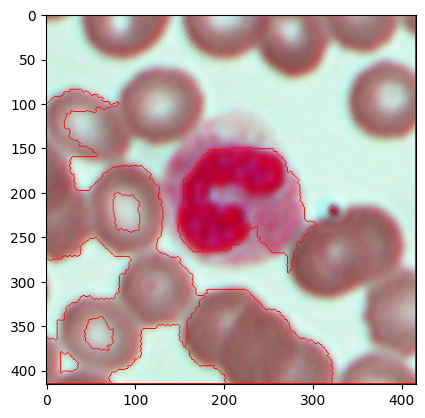

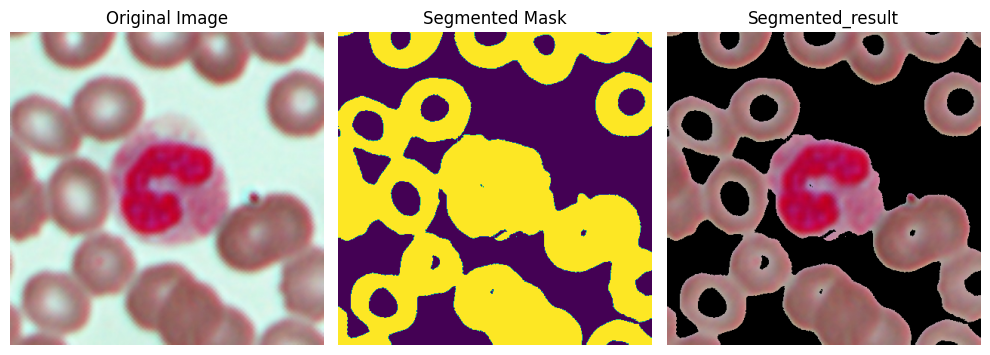

In [3]:
input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image13.jpg"
image = cv2.imread(input_path)
image_copy = image.copy()
pixels = image.reshape(-1, 3)
pixels = np.float32(pixels)
# Define the criteria for K-means clustering (maximum iterations and epsilon)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.5)

# Perform K-means clustering
k = 7  # Number of clusters
_, labels, centers = cv2.kmeans(
    pixels, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)

# Convert the centers to unsigned integers
centers = np.uint8(centers)
# Map the labels to the centers
segmented_image = centers[labels.flatten()]

# Reshape the segmented image back to the original shape
segmented_image = segmented_image.reshape(image.shape)

# Convert the segmented image to grayscale
segmented_image_gray = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2GRAY)

# Threshold the grayscale image
_, segmented_mask = cv2.threshold(
    segmented_image_gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
# Apply the segmented mask to the original image
segmented_result = cv2.bitwise_and(image_copy, image_copy, mask=segmented_mask)
# noise removal
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(
    segmented_mask, cv2.MORPH_OPEN, kernel, iterations=2)
# sure background area
sure_bg = cv2.dilate(opening, kernel, iterations=5)
# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown == 255] = 0
markers = cv2.watershed(image_copy, markers)
image_copy[markers == -1] = [255, 0, 0]
# Perform morphological operations to clean up the mask (e.g., opening, closing)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
# segmented_mask = cv2.morphologyEx(segmented_mask, cv2.MORPH_OPEN, kernel, iterations=4)
# segmented_mask = cv2.morphologyEx(segmented_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
plt.imshow(image_copy)
# Apply the segmented mask to the original image
# segmented_result = cv2.bitwise_and(image_copy,image_copy, mask=segmented_mask)


# Display the results
plt.figure(figsize=(10, 10))
plt.subplot(131)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(segmented_mask)
plt.title('Segmented Mask')
plt.axis('off')

plt.subplot(133)
plt.imshow(segmented_result)
plt.title('Segmented_result')
plt.axis('off')

plt.tight_layout()
plt.show()
# In this example, the K-means clustering algorithm is used to group similar colors in the image into clusters. The resulting segmented mask is obtained by thresholding the grayscale image, followed by morphological operations for cleaning up the mask. Finally, the segmented mask is applied to the original image to obtain the segmented result.

Flow of the project
1. input image is preprocessed for wbc detection and each wbc cell detected is cropped and brought to the center of the image .
2. A yolov5 model is trained on Blood cell images dataset for wbc differential
3. Final predictions were preprocessed to give only predictions with high confidence and present at the center of the image
4. Post processing operations are performed to imporve the predictions accuracy
5. Nucleus Contor(using hsv and lab colorspace) with 100% accuracy and cytoplasm(using kmeans clustering) with considerable accuracy was achieved along with the convex hull of both the contours
6. some features such as solidity, circularity, convexity were determined to understand the shape pattern among different wbc's


White Blood Cell Segmentation by Color-Space-Based K-Means Clustering

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

c:\Users\krrah\AppData\Local\Programs\Python\Python37\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [127]:
input_path = "C:\\Users\\krrah\\Downloads\\Dewinter2023\\Final_yolov5x\\cropped_images8\\final_image1.jpg"

In [128]:
rgb = cv2.imread(input_path, cv2.COLOR_BGR2RGB)

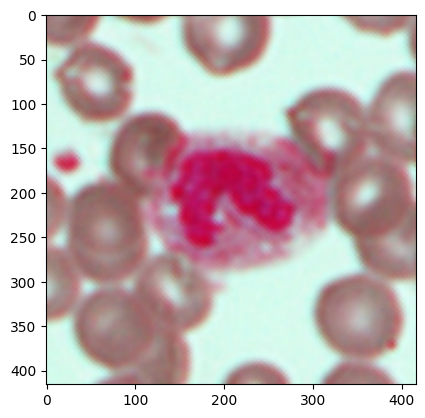

In [129]:
plt.imshow(rgb)

In [156]:
r, g, b = cv2.split(smoothed)

In [157]:
g_norm = cv2.normalize(g, None, 0, 255, cv2.NORM_MINMAX)

In [158]:


# Create a CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
# Apply CLAHE transform
clahe_image = clahe.apply(g_norm)

In [159]:
equalized_image = cv2.equalizeHist(clahe_image)

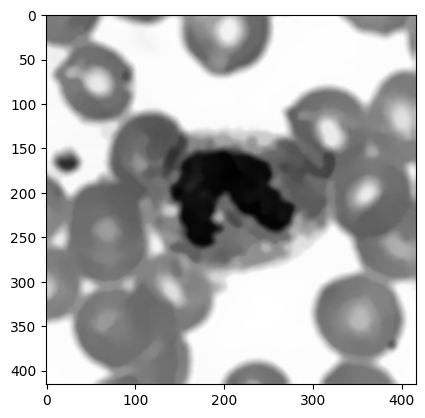

In [162]:
plt.imshow(g, cmap="gray")

In [173]:
# Apply thresholding
_, binary_image = cv2.threshold(
    color_reduced, thresh=135, maxval=255, type=cv2.THRESH_BINARY)

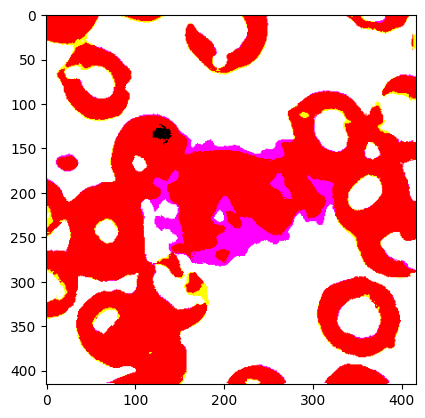

In [174]:

plt.imshow(binary_image)

In [152]:
# Perform color reduction
color_reduced = cv2.pyrMeanShiftFiltering(rgb, sp=10, sr=15, maxLevel=2)

# Perform smoothing
smoothed = cv2.GaussianBlur(color_reduced, (5, 5), 0)

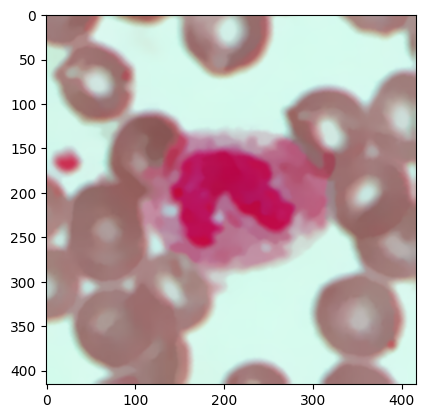

In [153]:
plt.imshow(smoothed)

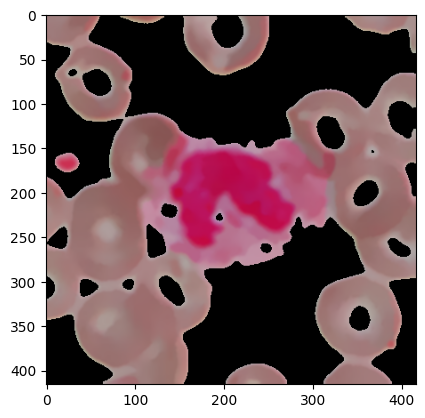

In [176]:
smoothed_copy = smoothed.copy()
pixels = smoothed.reshape(-1, 3)
pixels = np.float32(pixels)
# Define the criteria for K-means clustering (maximum iterations and epsilon)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.5)

# Perform K-means clustering
k = 5  # Number of clusters
_, labels, centers = cv2.kmeans(
    pixels, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)

# Convert the centers to unsigned integers
centers = np.uint8(centers)
# Map the labels to the centers
segmented_image = centers[labels.flatten()]

# Reshape the segmented image back to the original shape
segmented_image = segmented_image.reshape(smoothed.shape)

# Convert the segmented image to grayscale
segmented_image_gray = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2GRAY)

# Threshold the grayscale image
_, segmented_mask = cv2.threshold(
    segmented_image_gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
# Creating kernel
# kernel = np.ones((13, 13), np.uint8)
# Using cv2.erode() method
# segmented_mask = cv2.erode(segmented_mask, kernel)
# Apply the segmented mask to the original image
segmented_result = cv2.bitwise_and(
    smoothed_copy, smoothed_copy, mask=segmented_mask)
plt.imshow(segmented_result)

In [177]:
# Apply thresholding
_, binary_image = cv2.threshold(
    segmented_result, thresh=135, maxval=255, type=cv2.THRESH_BINARY)

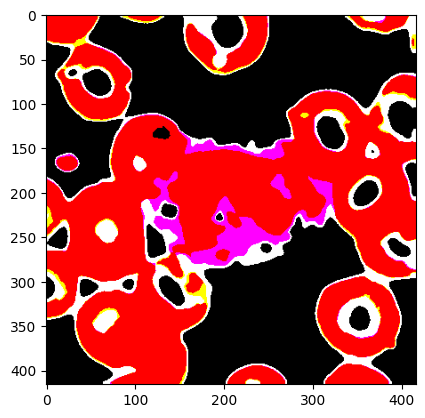

In [178]:
plt.imshow(binary_image)